In [128]:
# Import packages
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import torchvision.transforms as transforms
from torchvision import datasets
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import linregress
import time
import importlib
import data
import helpers
import RealFFT
from RealFFT import fft
from RealFFT import ifft
from RealFFT import rfft
from RealFFT import irfft
from IPython.display import clear_output
from PIL import Image

In [2]:
# Uncomment and run these when making changes to .py files that require reloading modules
# Can also restart kernel, but this allows for reloading without running everything again
importlib.reload(data)
importlib.reload(helpers)
importlib.reload(RealFFT)

<module 'RealFFT' from '/Users/ac.randono/Python Projects/Cloud Diffusion/RealFFT.py'>

In [3]:
device = helpers.getDevice()
print(device)

mps


In [4]:
clean_dataset, dirty_dataset = data.get_datasets(batch_size=64)
dataloader = torch.utils.data.DataLoader(clean_dataset, batch_size=64, shuffle=True)

37157/100000 images (37.157%), moved to dirty dataset.
Clean list clipped to 62784 images so it is divisible by batch_size=64.


In [52]:
mu, std = helpers.get_mu_and_std(dataloader, device=device)

Calculated mean and standard deviation in 32.915322065353394 seconds.


mu (min,max)=(0.39435240626335144,0.4827658236026764) || mu min/max difference=0.08841341733932495
std (min,max)=(0.21978409588336945,0.24983103573322296) || std min/max difference=0.030046939849853516


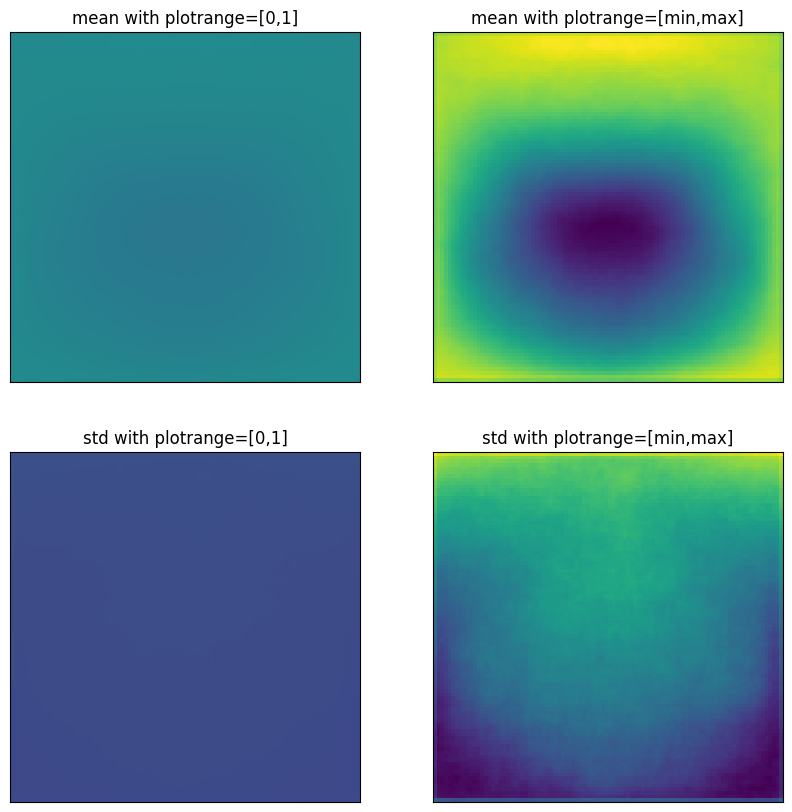

In [6]:
print(f"mu (min,max)=({mu.min()},{mu.max()}) || mu min/max difference={mu.max()-mu.min()}")
print(f"std (min,max)=({std.min()},{std.max()}) || std min/max difference={std.max()-std.min()}")

fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(10, 10))
axs[0][0].set_title("mean with plotrange=[0,1]")
axs[0][0].imshow(mu.to("cpu"), vmin=0, vmax=1)
axs[0][1].set_title("mean with plotrange=[min,max]")
axs[0][1].imshow(mu.to("cpu"), vmin=mu.min(), vmax=mu.max())

axs[1][0].set_title("std with plotrange=[0,1]")
axs[1][0].imshow(std.to("cpu"), vmin=0, vmax=1)
axs[1][1].set_title("std with plotrange=[min,max]")
axs[1][1].imshow(std.to("cpu"), vmin=std.min(), vmax=std.max())
plt.setp(axs, xticks=[], yticks=[])

plt.show()

In [7]:
Delta = 1.5

In [8]:
noise_generator = helpers.NoiseGenerator(N=96, device=device)

In [9]:
# Computing the value of A that normalizes the noise in real space to have a pointwise standard deviation of 1 
A = noise_generator.get_normalizing_A(Delta, device=device)

For N = 96, ∆ = 1.5 to normalize position-space cloud noise to have std=1 use:
A = 0.10360249718757145


In [ ]:
A = 0.10360249718757145

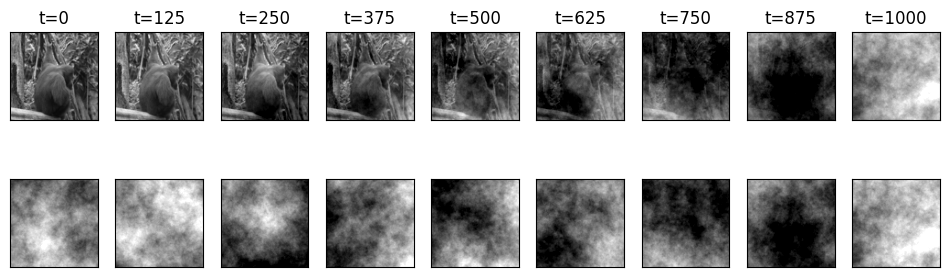

In [11]:
T=8
q = np.random.randint(len(clean_dataset))
x0 = helpers.normalize(clean_dataset[q][0].squeeze(), mu, std)
fig, axs = plt.subplots(nrows=2, ncols=T+1, figsize=(12, 3.5))
plt.setp(axs, xticks=[], yticks=[])

for t in range(T+1):
    theta = np.pi/2*(t/T)
    cos = np.cos(theta)
    sin = np.sin(theta)
    #noise = torch.randn(96,96)
    noise = noise_generator.generate_monochrome_noise(A=0.10391969358944717, batch_size=1, Delta=Delta)[0].real.squeeze()
    x = helpers.denormalize(cos*x0+sin*noise, mu, std)
    axs[0][t].imshow(x, vmin=0, vmax=1, cmap="gray")
    axs[0][t].set_title(f"t={t*125}")
    axs[1][t].imshow(noise, vmin=-2, vmax=2, cmap="gray")

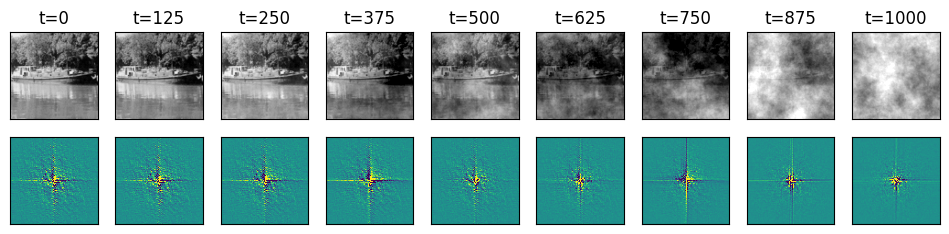

In [12]:
T=8
q = np.random.randint(len(clean_dataset))
x0 = helpers.normalize(clean_dataset[q][0].squeeze(), mu, std)
fig, axs = plt.subplots(nrows=2, ncols=T+1, figsize=(12, 2.5))
plt.setp(axs, xticks=[], yticks=[])

for t in range(T+1):
    theta = np.pi/2*(t/T)
    cos = np.cos(theta)
    sin = np.sin(theta)
    #noise = torch.randn(96,96)
    noise = noise_generator.generate_monochrome_noise(A=0.10391969358944717, batch_size=1, Delta=Delta)[0].real.squeeze()
    x = helpers.denormalize(cos*x0+sin*noise, mu, std)
    y = rfft(x)
    axs[0][t].imshow(x, vmin=0, vmax=1, cmap="gray")
    axs[0][t].set_title(f"t={t*125}")
    axs[1][t].imshow(y, vmin=-.3, vmax=.3)

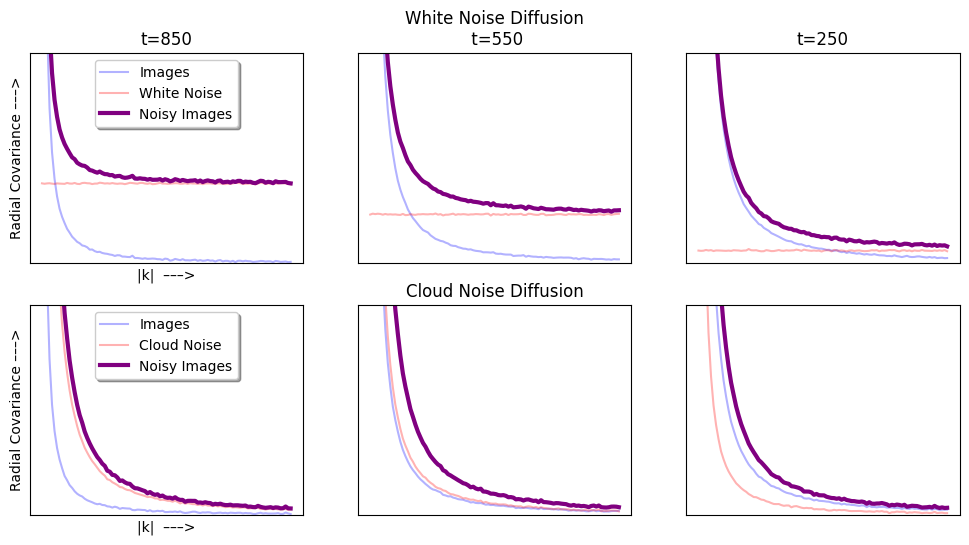

In [13]:
t = (.85,.55,.25)
linewidth = 1.5

# cos = np.cos(np.pi/2*t)
# sin = np.sin(np.pi/2*t)
# indices = torch.arange(100)
# x_signal = cos*2*1/(indices/10+.1)**1.5 +.005*torch.randn(100)
# x_noise = sin**2*torch.ones(100)+ +.005*torch.randn(100)

fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(12, 6))

for i in range(3):
    cos = np.cos(np.pi/2*t[i])
    sin = np.sin(np.pi/2*t[i])
    indices = torch.arange(100)
    x1_signal = cos*2*1/(indices/10+.1)**1.5 +.005*torch.randn(100)
    x1_noise = sin**2*torch.ones(100)+ +.005*torch.randn(100)
    x2_signal = cos*2*1/(indices/10+.1)**1.5 +.005*torch.randn(100)
    x2_noise = sin*2*1/(indices/10+.1)**1.5 +.005*torch.randn(100)
    
    axs[0,i].plot(indices, x1_signal, color='blue', alpha=0.3, linewidth=linewidth)
    axs[0,i].plot(indices, x1_noise, color='red', alpha=0.3, linewidth=linewidth)
    axs[0,i].plot(indices, x1_signal+ x1_noise, color='purple', alpha=1, linewidth=2*linewidth)
    axs[0,i].set_ylim(0,2.5)
    
    axs[1,i].plot(indices, x2_signal, color='blue', alpha=0.3, linewidth=linewidth)
    axs[1,i].plot(indices, x2_noise, color='red', alpha=0.3, linewidth=linewidth)
    axs[1,i].plot(indices, x2_signal+ x2_noise, color='purple', alpha=1, linewidth=2*linewidth)
    axs[1,i].set_ylim(0,2.5)
    
axs[0,0].set_xlabel("|k|  –––>")
axs[0,0].set_ylabel(f"Radial Covariance –––>")
axs[0,0].set_title(f"t={np.int16(t[0]*1000)}")
axs[0,1].set_title(f"White Noise Diffusion\n t={np.int16(t[1]*1000)}")
axs[0,2].set_title(f"t={np.int16(t[2]*1000)}")
axs[0,0].legend(('Images', 'White Noise', 'Noisy Images'), loc='upper center', shadow=True)

axs[1,0].set_xlabel("|k|  –––>")
axs[1,0].set_ylabel(f"Radial Covariance –––>")
axs[1,1].set_title(f"Cloud Noise Diffusion")
axs[1,0].legend(('Images', 'Cloud Noise', 'Noisy Images'), loc='upper center', shadow=True)
    
plt.setp(axs, xticks=[], yticks=[])
plt.show()

In [14]:
noise_generator_288 = helpers.NoiseGenerator(N=288, device=device)

[]

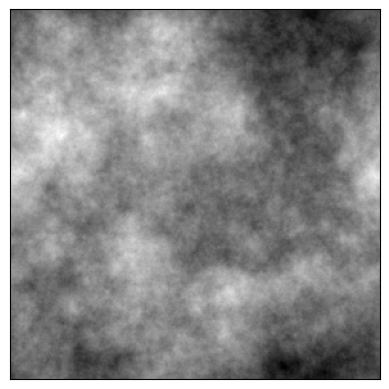

In [15]:
dist = noise_generator_288.dist.squeeze().to("cpu")
x = torch.randn(288,288)/(dist**1.5)
x[288//2,288//2]=0.0
x = irfft(x)

fig, axs = plt.subplots()
plt.imshow(x, cmap="gray")
plt.setp(axs, xticks=[], yticks=[])

[]

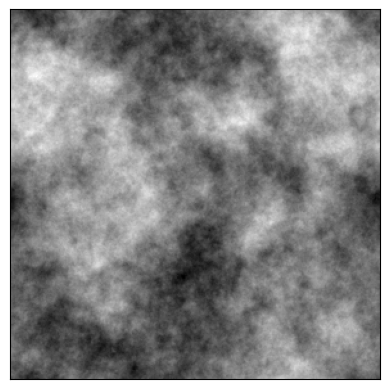

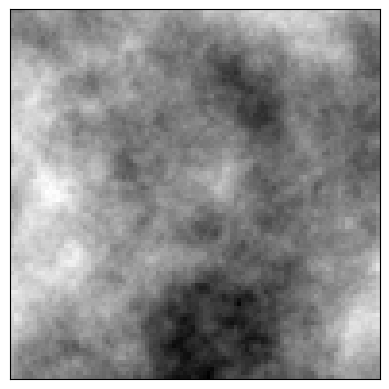

In [16]:
dist = noise_generator_288.dist.squeeze().to("cpu")
x = torch.randn(288,288)/(dist**1.5)
x[288//2,288//2]=0.0
x = irfft(x)

y = x[96:192, 96:192]

fig, axs = plt.subplots()
plt.imshow(x, cmap="gray")
plt.setp(axs, xticks=[], yticks=[])

fig, axs = plt.subplots()
plt.imshow(y, cmap="gray")
plt.setp(axs, xticks=[], yticks=[])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(-0.0997)
tensor(1.0445)


[]

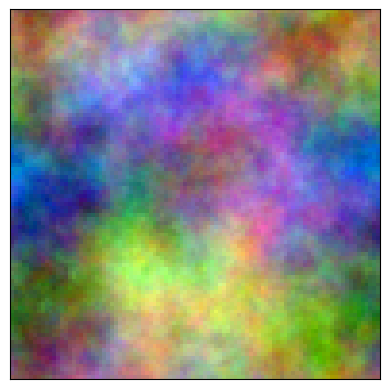

In [17]:
dist = noise_generator.dist.squeeze().to("cpu")
x = torch.randn(3,96,96)/(dist**1.5)
x[:,96//2,96//2]=0.0
x = irfft(x)/130
x = x/2+.5
print(x.min())
print(x.max())

fig, axs = plt.subplots()
plt.imshow(torch.einsum("cij->ijc", x))
plt.setp(axs, xticks=[], yticks=[])

In [18]:
Gamma, C = helpers.get_Gamma_and_C(dataloader, mu, std, device=device)

Completed in 99.07103300094604 seconds.


In [19]:
Gamma_diag = torch.einsum("ijij->ij", Gamma)

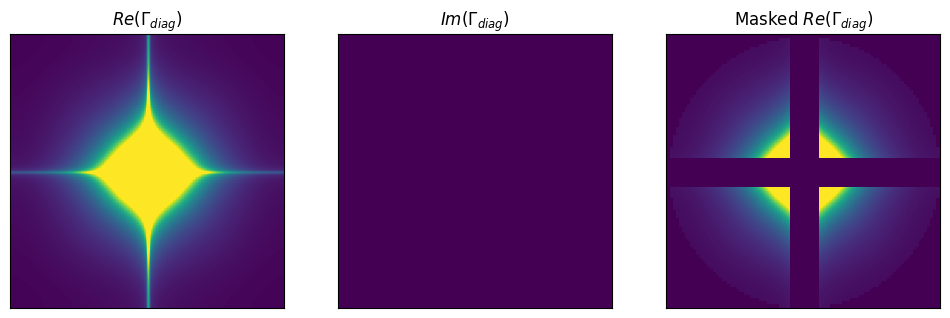

In [20]:
vmin=0
vmax=.7
a=5
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(12,6))
axs[0].imshow(Gamma_diag.real.to("cpu"), vmin=vmin, vmax=vmax)
axs[1].imshow(Gamma_diag.imag.to("cpu"), vmin=vmin, vmax=vmax)
axs[2].imshow(helpers.mask_this(Gamma_diag.abs().to("cpu"), a=a, mask_value=-1000000), vmin=0, vmax=vmax)

axs[0].set_title(r"$Re(\Gamma_{diag})$")
axs[1].set_title(r"$Im(\Gamma_{diag})$")
axs[2].set_title(r"Masked $Re(\Gamma_{diag})$")

plt.setp(axs, xticks=[], yticks=[])


plt.show()

LinregressResult(slope=-2.9998746022249994, intercept=-5.962823409395362, rvalue=-0.9857808592873494, pvalue=0.0, stderr=0.005746321022545254, intercept_stderr=0.006091513111485194)
From the slope of the log-log plot we determine the factors A and ∆:
A=0.05072117997169169
∆=1.4999373011124997


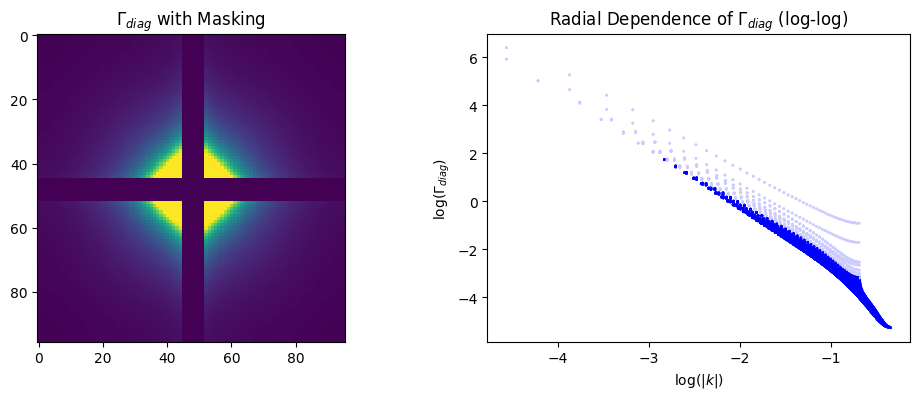

In [21]:
A, Delta = helpers.get_radial_dependence(Gamma, a=4, R=10)

In [22]:
A0 = noise_generator.get_normalizing_A(Delta=0, device=device)
A1 = noise_generator.get_normalizing_A(Delta=1, device=device)
A15 = noise_generator.get_normalizing_A(Delta=1.5, device=device)
A2 = noise_generator.get_normalizing_A(Delta=2, device=device)

For N = 96, ∆ = 2 to normalize position-space cloud noise to have std=1 use:
A = 0.012975223808553676


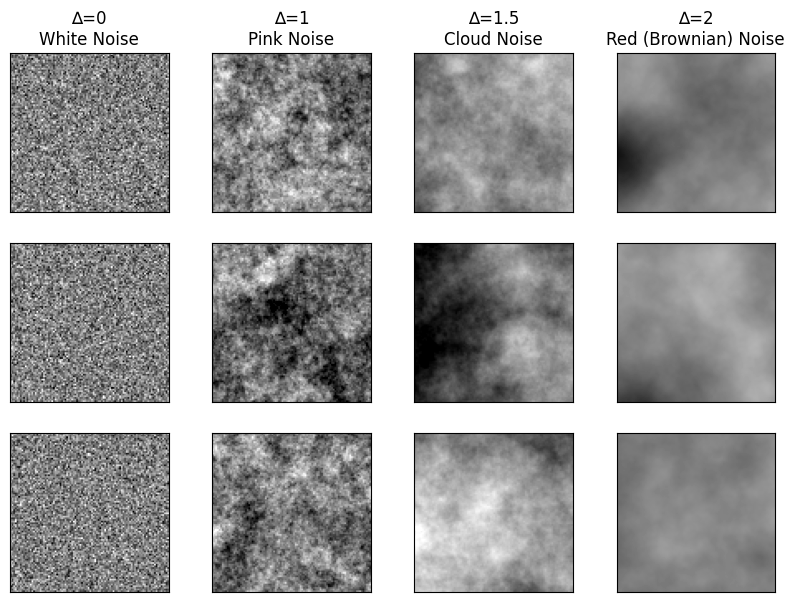

In [23]:
fig, axs = plt.subplots(nrows=3, ncols=4, figsize=(10, 7))
samples = 3

# Noise Samples
white_sample = noise_generator.generate_monochrome_noise(A=A0, batch_size=samples, Delta=0)[0].real.to("cpu").squeeze()
pink_sample = noise_generator.generate_monochrome_noise(A=A1, batch_size=samples, Delta=1)[0].real.to("cpu").squeeze()
cloud_sample = noise_generator.generate_monochrome_noise(A=A15, batch_size=samples, Delta=1.5)[0].real.to("cpu").squeeze()
brownian_sample = noise_generator.generate_monochrome_noise(A=A2, batch_size=samples, Delta=2)[0].real.to("cpu").squeeze()

a = 2.7
for i in range(samples):
    axs[i][0].imshow(white_sample[i,...], vmin=-a, vmax=a, cmap="gray")
    axs[i][1].imshow(pink_sample[i,...], vmin=-a, vmax=a, cmap="gray")
    axs[i][2].imshow(cloud_sample[i,...], vmin=-a, vmax=a, cmap="gray")
    axs[i][3].imshow(brownian_sample[i,...], vmin=-a, vmax=a, cmap="gray")
    
axs[0][0].set_title(f"∆=0\nWhite Noise")
axs[0][1].set_title(f"∆=1\nPink Noise")
axs[0][2].set_title(f"∆=1.5\nCloud Noise")
axs[0][3].set_title(f"∆=2\nRed (Brownian) Noise")

plt.setp(axs, xticks=[], yticks=[])

plt.show()

Noise for Delta=1.4999373011124997, A=0.05072117997169169


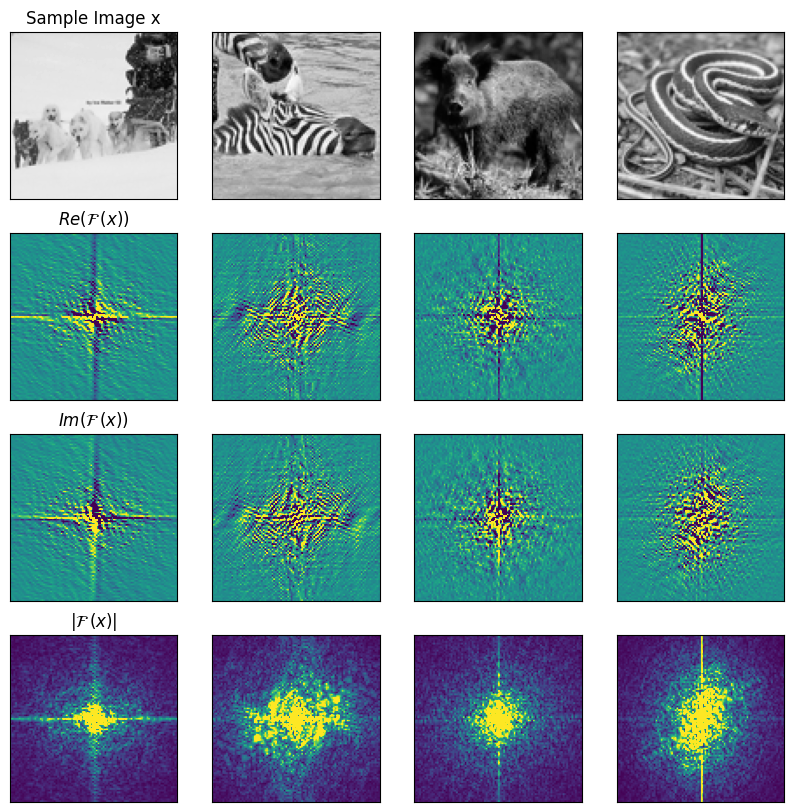

In [24]:
print(f"Noise for Delta={Delta}, A={A}")
    
fig, axs = plt.subplots(nrows=4, ncols=4, figsize=(10, 10))

a1=.2
a2=.4

for i in range(4):
    randint = np.random.randint(len(clean_dataset))
    x = clean_dataset[randint][0].squeeze()
    X = fft(x)
    axs[0][i].imshow(x, vmin=0, vmax=1, cmap="gray")
    axs[1][i].imshow(X.real.to("cpu"), vmin=-a1, vmax=a1)
    axs[2][i].imshow(X.imag.to("cpu"), vmin=-a1, vmax=a1)
    axs[3][i].imshow(X.abs().to("cpu"), vmin=0, vmax=a2)
    
axs[0][0].set_title("Sample Image x")
axs[1][0].set_title(r"$Re(\mathcal{F}\,(x))$")
axs[2][0].set_title(r"$Im(\mathcal{F}\,(x))$")
axs[3][0].set_title(r"$|\mathcal{F}\,(x)|$")

plt.setp(axs, xticks=[], yticks=[])
plt.show()

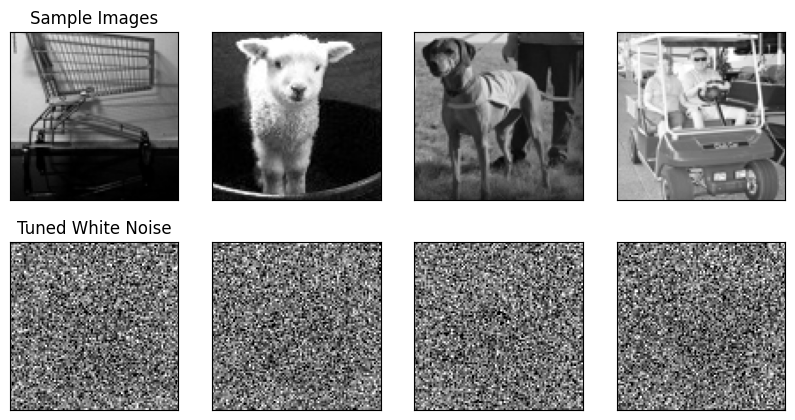

In [25]:
fig, axs = plt.subplots(nrows=2, ncols=4, figsize=(10, 5))

for i in range(4):
    randint = np.random.randint(len(clean_dataset))
    x = clean_dataset[randint][0].squeeze()
    noise = std.to("cpu")*torch.randn(96,96)+mu.to("cpu")
    axs[0][i].imshow(x, vmin=0, vmax=1, cmap="gray")
    axs[1][i].imshow(noise, vmin=0, vmax=1, cmap="gray")
    
axs[0][0].set_title(f"Sample Images")
axs[1][0].set_title(f"Tuned White Noise")

plt.setp(axs, xticks=[], yticks=[])
plt.show()

In [26]:
A

0.05072117997169169

Text(0.5, 1.0, 'FFT cloud noise')

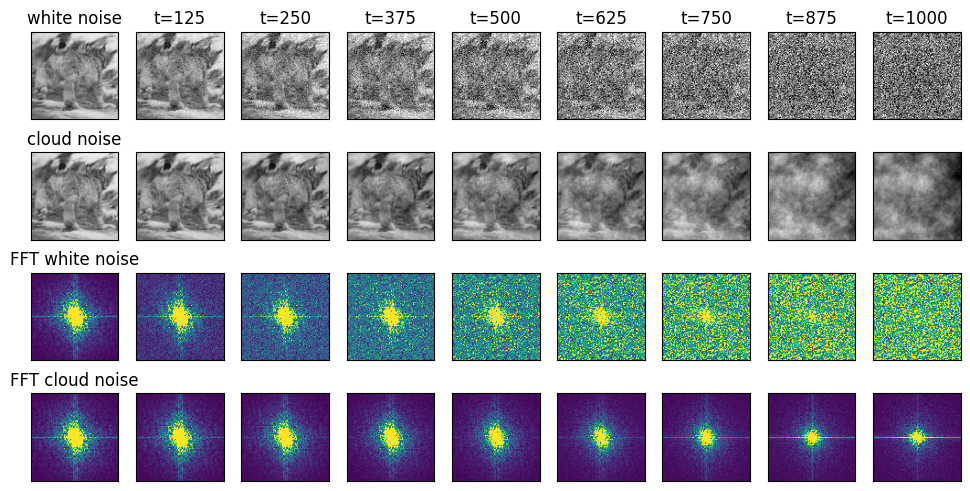

In [38]:
T=8
q = np.random.randint(len(clean_dataset))
x0 = helpers.normalize(clean_dataset[q][0].squeeze(), mu, std)
fig, axs = plt.subplots(nrows=4, ncols=T+1, figsize=(12, 6))
plt.setp(axs, xticks=[], yticks=[])

theta = 0
d_theta = (np.pi/2)/T
alpha = d_theta

d_cos = np.cos(alpha)
d_sin = np.sin(alpha)

previous_white_noise = new_cloud_noise = torch.randn(96,96)
previous_cloud_noise = noise_generator.generate_monochrome_noise(A=A15, batch_size=1, Delta=Delta)[0].real.squeeze()

for t in range(T+1):
    cos = np.cos(theta)
    sin = np.sin(theta)
    
    new_white_noise = torch.randn(96,96)
    new_cloud_noise = noise_generator.generate_monochrome_noise(A=A15, batch_size=1, Delta=Delta)[0].real.squeeze()
    
    current_white_noise = (d_cos*previous_white_noise+d_sin*new_white_noise)
    current_cloud_noise = (d_cos*previous_cloud_noise+d_sin*new_cloud_noise)
    
    x_white = cos*x0+sin*current_white_noise
    x_cloud = cos*x0+sin*current_cloud_noise
    
    X_white = helpers.denormalize(x_white, mu, std)
    X_cloud = helpers.denormalize(x_cloud, mu, std)
    
    Z_white = fft(X_white).abs()
    Z_cloud = fft(X_cloud).abs()
    
    axs[0][t].imshow(X_white, vmin=0, vmax=1, cmap="gray")
    axs[1][t].imshow(X_cloud, vmin=0, vmax=1, cmap="gray")
    axs[2][t].imshow(Z_white, vmin=0, vmax=.3)
    axs[3][t].imshow(Z_cloud, vmin=0, vmax=.3)
    
    axs[0][t].set_title(f"t={t*125}")
    
    previous_white_noise = current_white_noise
    previous_cloud_noise = current_cloud_noise
    theta+=d_theta
    
axs[0][0].set_title("white noise")
axs[1][0].set_title("cloud noise")
axs[2][0].set_title("FFT white noise")
axs[3][0].set_title("FFT cloud noise")

Text(0.5, 1.0, 'FFT cloud noise')

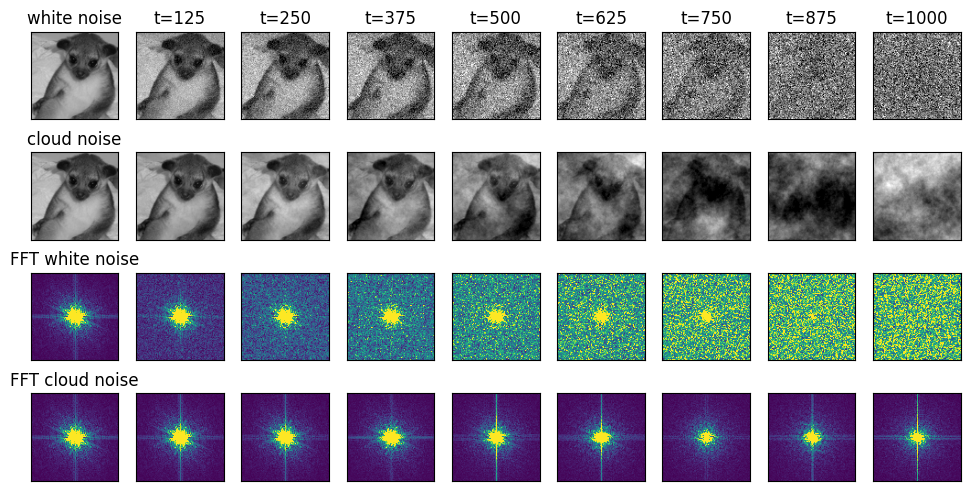

In [49]:
T=8
q = np.random.randint(len(clean_dataset))
x0 = helpers.normalize(clean_dataset[q][0].squeeze(), mu, std)
fig, axs = plt.subplots(nrows=4, ncols=T+1, figsize=(12, 6))
plt.setp(axs, xticks=[], yticks=[])

theta = 0
d_theta = (np.pi/2)/T

x_white = x0
x_cloud = x0

for t in range(0,T+1):
    if t==0:
        C1 = 1 
        C2 = 0
    elif t==T:
        C1 = 0
        C2 = 1
    else:
        C1 = np.cos(theta+d_theta)/np.cos(theta)
        C2 = np.sqrt(1-C1**2)
    
    new_white_noise = torch.randn(96,96)
    new_cloud_noise = noise_generator.generate_monochrome_noise(A=A15, batch_size=1, Delta=Delta)[0].real.squeeze()
    
    x_white = C1*x_white + C2*new_white_noise
    x_cloud = C1*x_cloud + C2*new_cloud_noise
    
    X_white = helpers.denormalize(x_white, mu, std)
    X_cloud = helpers.denormalize(x_cloud, mu, std)
    
    Z_white = fft(X_white).abs()
    Z_cloud = fft(X_cloud).abs()
    
    axs[0][t].imshow(X_white, vmin=0, vmax=1, cmap="gray")
    axs[1][t].imshow(X_cloud, vmin=0, vmax=1, cmap="gray")
    axs[2][t].imshow(Z_white, vmin=0, vmax=.3)
    axs[3][t].imshow(Z_cloud, vmin=0, vmax=.3)
    
    axs[0][t].set_title(f"t={t*125}")
    
    if t != 0:
        theta+=d_theta
    
axs[0][0].set_title("white noise")
axs[1][0].set_title("cloud noise")
axs[2][0].set_title("FFT white noise")
axs[3][0].set_title("FFT cloud noise")

In [535]:
sig_w = torch.ones(96,96,96,96).to(device)
for n in range(10000):
    X = rfft(torch.randn(96,96).to(device))
    _sig_w = torch.einsum("ij,kl->ijkl", X,X)
    sig_w = (sig_w*n + _sig_w)/(n+1)
    if n%100==0:
        print(f"{n/10000*100}% complete")
        clear_output(wait=True)

99.0% complete


In [536]:
sig_diag = torch.einsum("ijij->ij", sig_w)

tensor(0.4759, device='mps:0')
tensor(1.0230, device='mps:0')
tensor(0.5003, device='mps:0')
tensor(1.0057, device='mps:0')
tensor(1.0230, device='mps:0')
tensor(1.0116, device='mps:0')
tensor(1.0107, device='mps:0')


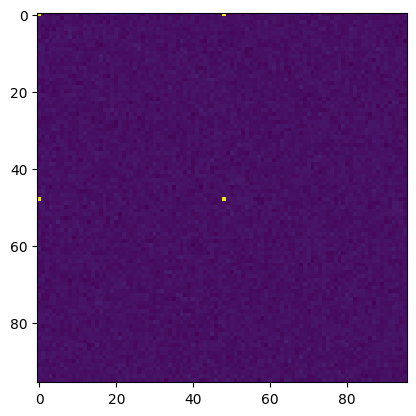

In [537]:
print(sig_diag.min())
print(sig_diag.max())
print(sig_diag.mean())
print(sig_diag[0,0])
print(sig_diag[0,96//2])
print(sig_diag[96//2,0])
print(sig_diag[96//2,96//2])
plt.imshow(sig_diag.to("cpu"))

tensor(0.9518, device='mps:0')
tensor(1.0502, device='mps:0')
tensor(1.0001, device='mps:0')
tensor(0.0140, device='mps:0')


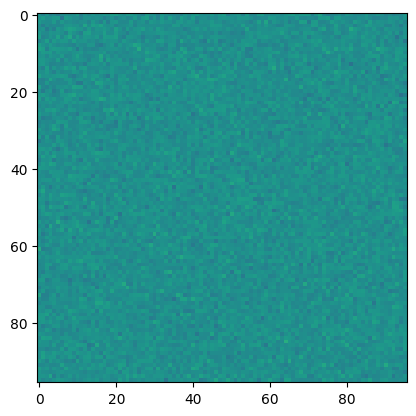

In [540]:
sig_diag_2=2*sig_diag
sig_diag_2[0,0] = sig_diag[0,0]
sig_diag_2[48,0] = sig_diag[48,0]
sig_diag_2[0,48] = sig_diag[0,48]
sig_diag_2[48,48] = sig_diag[48,48]
plt.imshow(sig_diag_2.to("cpu"), vmin=.8, vmax=1.2)
print(sig_diag_2.min())
print(sig_diag_2.max())
print(sig_diag_2.mean())
print(sig_diag_2.std())

tensor(0.5071, device='mps:0')


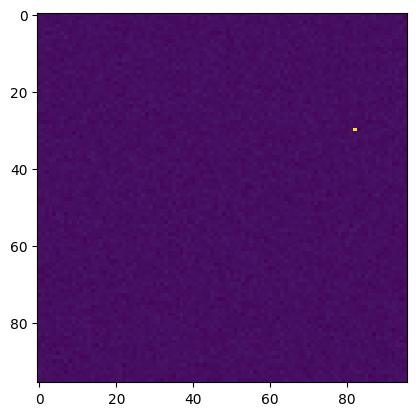

In [576]:
i = np.random.randint(96)
j = np.random.randint(96)
print(sig_w[i,j,i,j])
plt.imshow(sig_w[:,:,i,j].to("cpu"))
plt.show()

In [126]:
S = torch.tensor([[4.0,5.0,2.0],[6.0,12.0,3.0],[7.0,8.0,9.0]])
Lambda = torch.diag(torch.tensor([20.,137.,65.]))
SI = torch.linalg.inv(S)
M = torch.einsum("im,mn,nj->ij", S, Lambda, SI)

print(S)
print(Lambda)
print(SI)
print(M)

tensor([[ 4.,  5.,  2.],
        [ 6., 12.,  3.],
        [ 7.,  8.,  9.]])
tensor([[ 20.,   0.,   0.],
        [  0., 137.,   0.],
        [  0.,   0.,  65.]])
tensor([[ 8.4848e-01, -2.9293e-01, -9.0909e-02],
        [-3.3333e-01,  2.2222e-01,  1.8965e-09],
        [-3.6364e-01,  3.0303e-02,  1.8182e-01]])
tensor([[-207.7273,  132.7272,   16.3636],
        [-517.0910,  336.0909,   24.5455],
        [-459.2728,  220.2727,   93.6364]])


In [121]:
L,V = torch.linalg.eig(M)

In [122]:
print(L.real)
print(V.real)

tensor([137.0001,  19.9998,  65.0000])
tensor([[0.3276, 0.3980, 0.2063],
        [0.7861, 0.5970, 0.3094],
        [0.5241, 0.6965, 0.9283]])


In [117]:
print(M)
print(torch.einsum("im,mn,nj->ij", V.real, torch.diag(L.real), torch.linalg.inv(V.real)))

tensor([[-207.7273,  132.7272,   16.3636],
        [-517.0910,  336.0909,   24.5455],
        [-459.2728,  220.2727,   93.6364]])
tensor([[-207.7274,  132.7273,   16.3636],
        [-517.0908,  336.0909,   24.5454],
        [-459.2727,  220.2727,   93.6364]])


In [167]:
image_path = "Waldo_0.jpg"  # Replace with the actual path to your image
pil_image = Image.open(image_path)

In [168]:
trans = transforms.ToTensor()
grays = transforms.Grayscale()
waldo = trans(pil_image)
waldo_normalized = (waldo-waldo.mean())/waldo.std()
waldo_gray = grays(waldo).squeeze()
waldo_gray_normalized = (waldo_gray-waldo_gray.mean())/waldo_gray.std()

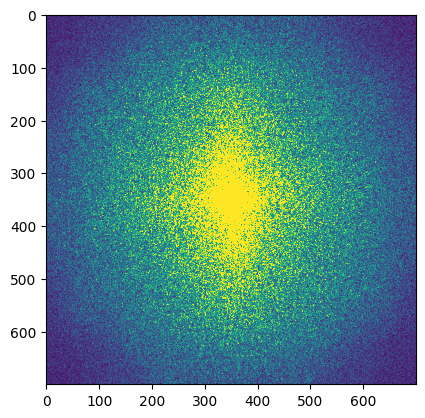

In [186]:
plt.imshow(rfft(waldo_gray_normalized).abs(), vmin=0, vmax=1)

In [169]:
waldo_normalized.min()

tensor(-1.9155)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


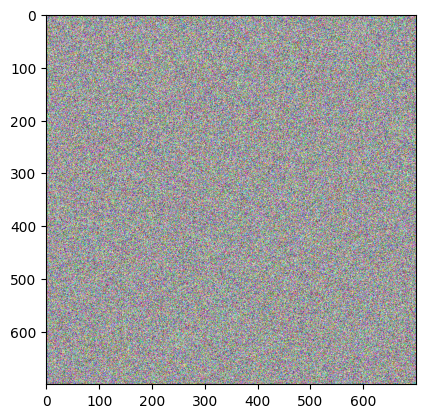

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


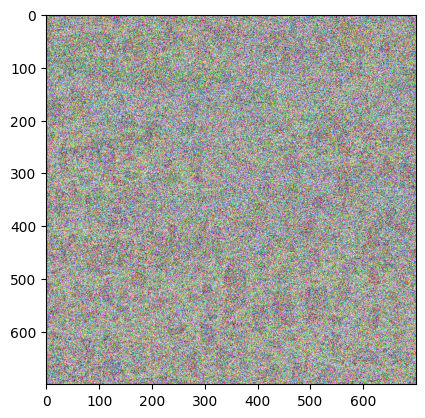

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


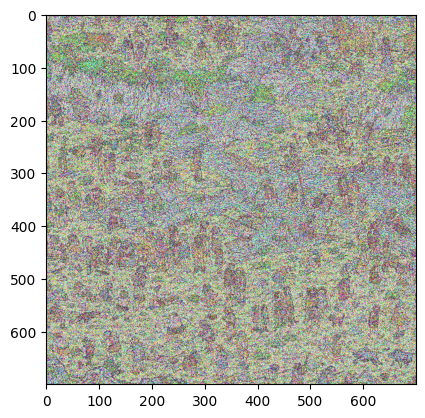

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


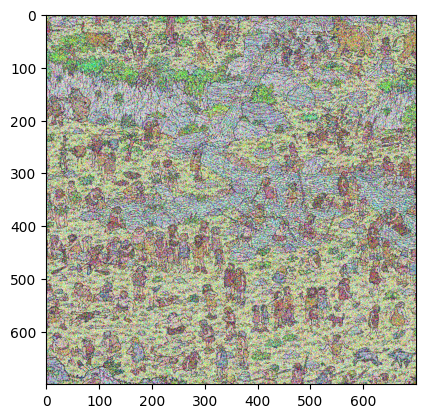

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


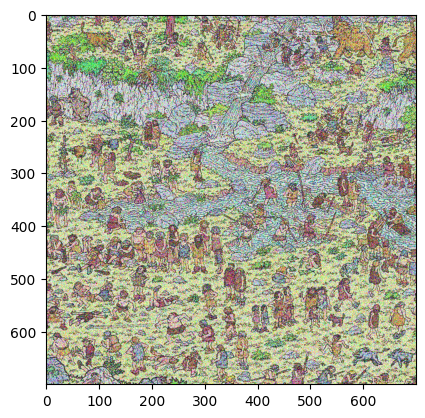

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


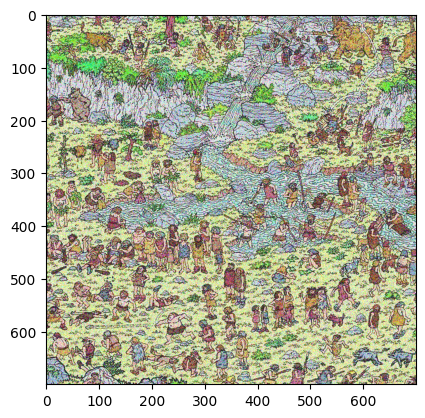

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


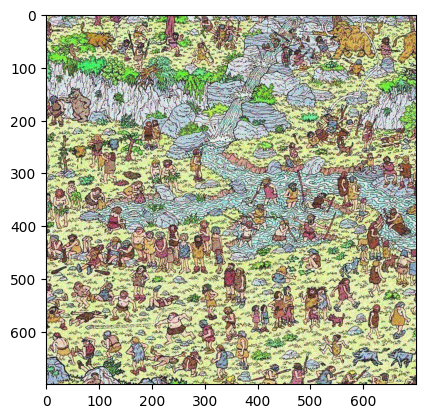

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


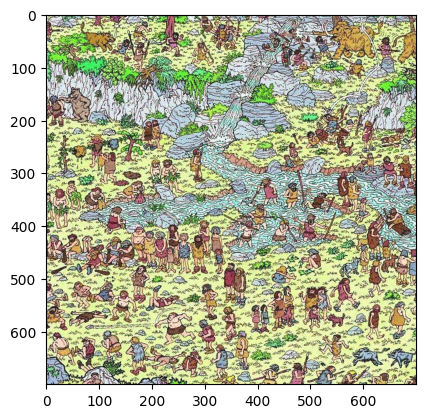

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


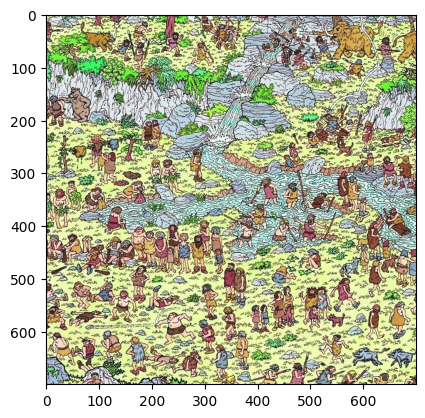

In [170]:
T = 8
for t in range(T+1):
    cos = np.cos(np.pi/2 * (T-t)/T)
    sin = np.sin(np.pi/2 * (T-t)/T)
    noise = torch.randn_like(waldo_normalized)
    noisy_waldo = cos*waldo_normalized + sin*noise
    Noisy_waldo = helpers.denormalize(noisy_waldo, waldo_gray.mean(), waldo_gray.std())
    plt.imshow(torch.einsum("cij->ijc", Noisy_waldo))
    plt.show()